#### Implementar seguintes máscaras:
- Média
- Guassiano
- Laplaciano
- Sobel X
- Sobel Y
- Gradiente (Sobel X + Sobel Y)
- Laplaciano somado a imagem original

In [ ]:
from matplotlib import pyplot as plt
from scipy.signal import convolve2d
from scipy.ndimage import gaussian_filter
from scipy import ndimage, signal
import numpy as np
import matplotlib.cm as cm
from PIL import Image
import cv2

lena_img = Image.open(r'..\images\lena_gray_512.tif')
cam_img = Image.open(r'..\images\cameraman.tif')
biel_img = Image.open(r'..\images\biel.png')

lena_cv = cv2.imread(r'..\images\lena_gray_512.tif')
cam_cv = cv2.imread(r'..\images\cameraman.tif')
biel_cv = cv2.imread(r'..\images\biel.png')

lena = np.array(lena_img)
cam = np.array(cam_img)
biel = np.array(biel_img)

### Função para exibição das Imagens 

In [ ]:
def show_img2(img_original, img_new, title1, title2):
    fig = plt.figure(figsize=(10, 5))
    plt1 = plt.subplot(1, 2, 1)
    plt2 = plt.subplot(1, 2, 2)
    plt1.title.set_text(title1)
    plt2.title.set_text(title2)
    plt1.imshow(img_original, cmap='gray', vmin=0, vmax=255)
    plt2.imshow(img_new, cmap='gray', vmin=0, vmax=255)
    plt.subplots_adjust(wspace=0.5)

### Função de convolução

In [ ]:
def convolution(image, mask):
    width, height = image.shape
    newImage= np.zeros((width, height))
    a = int((mask.shape[0]-1)/2)
    for x in range(a, width-a):
        for y in range(a, height-a):
            sub_img = image[x-a:x+a+1, y-a:y+a+1]
            newImage[x,y] = np.sum(np.multiply(sub_img, mask))

    return newImage

### Convolução

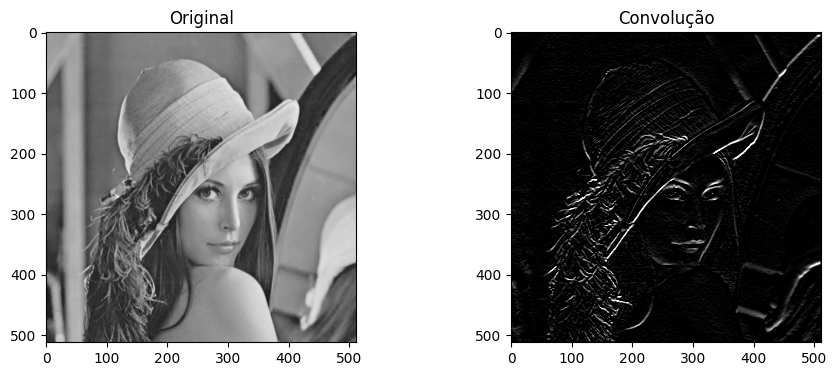

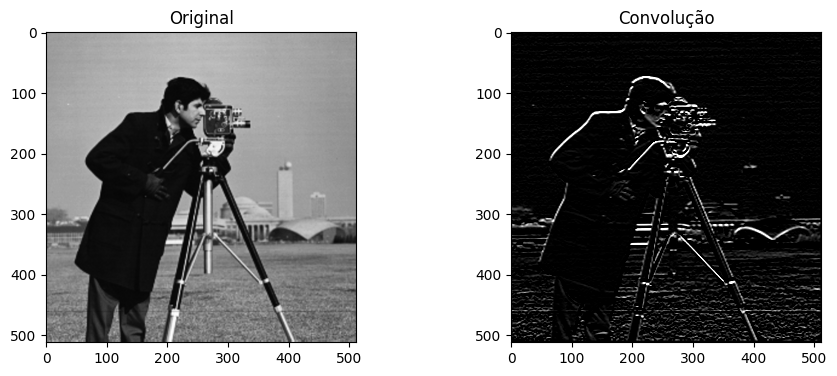

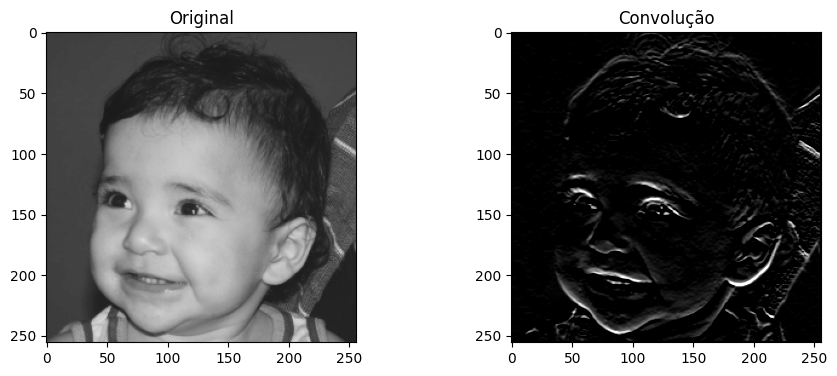

In [ ]:
mask =  np.array(([[1,2,1],[0,0,0],[-1,-2,-1]]), dtype="int")
new_lena = convolution(lena, mask)
show_img2(lena, new_lena, "Original", "Convolução")
new_cam = convolution(cam, mask)
show_img2(cam, new_cam, "Original", "Convolução")
new_biel = convolution(biel, mask)
show_img2(biel, new_biel, "Original", "Convolução")
 

#### OpenCv

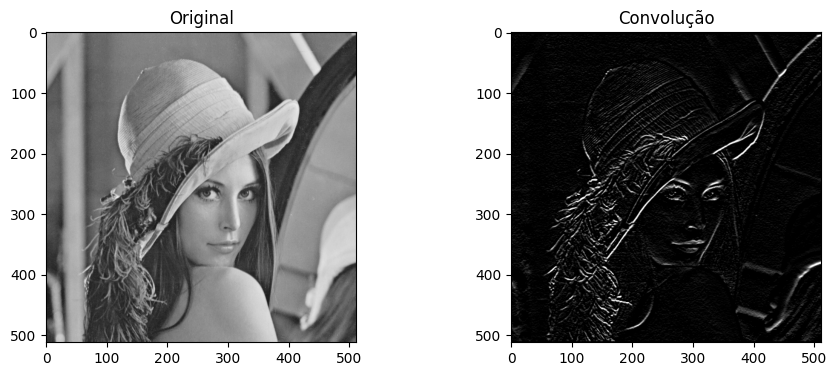

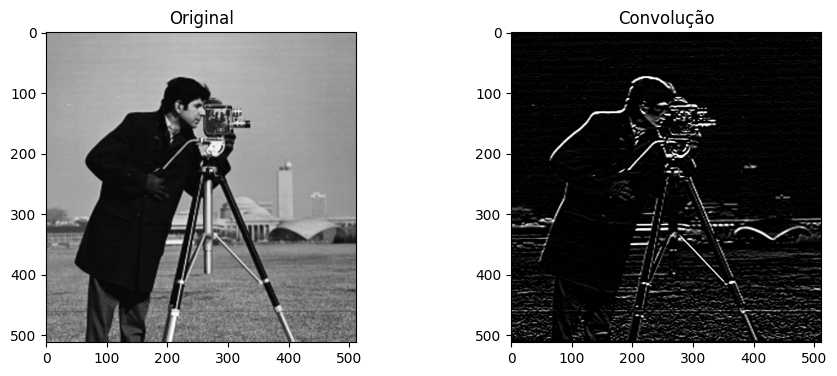

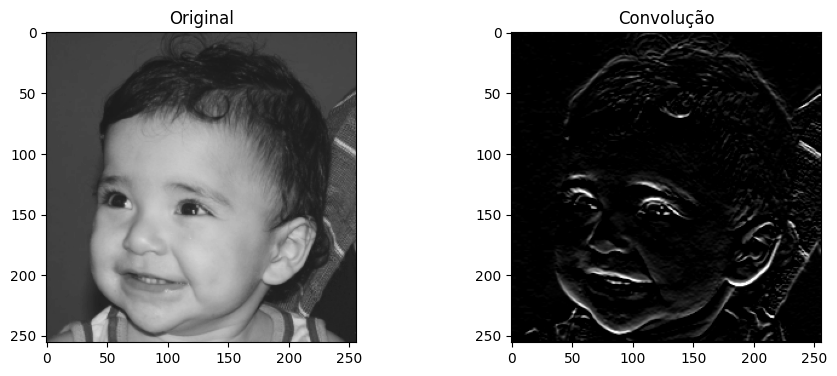

In [ ]:
def convolve_cv(image):
    kernel2 =  np.array(([[1,2,1],[0,0,0],[-1,-2,-1]]), dtype="int")
    img = cv2.filter2D(src=image, ddepth=-1, kernel=kernel2)
    return img

new_lena = convolve_cv(lena)
show_img2(lena, new_lena, "Original", "Convolução")
new_cam = convolve_cv(cam)
show_img2(cam, new_cam, "Original", "Convolução")
new_biel = convolve_cv(biel)
show_img2(biel, new_biel, "Original", "Convolução")

#### Scipy

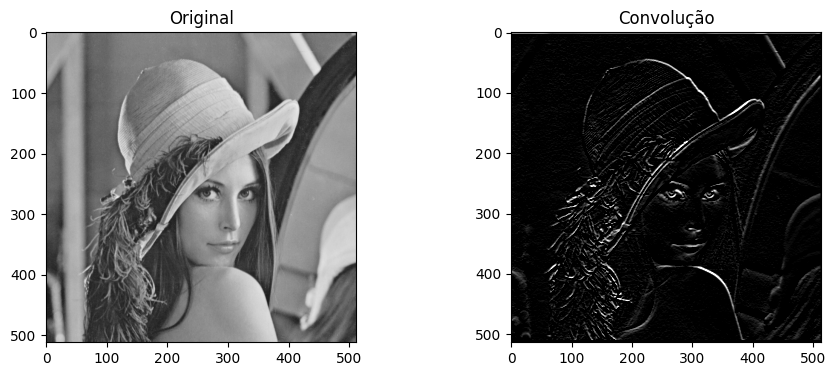

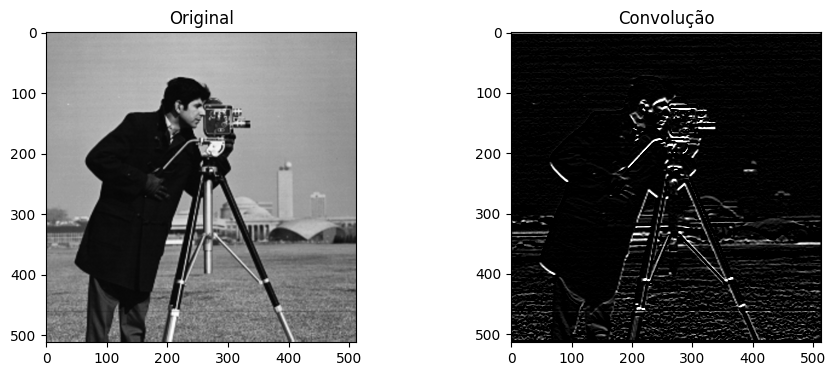

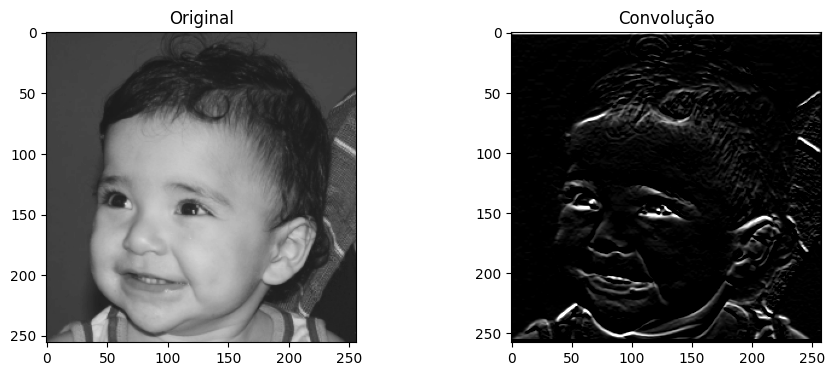

In [ ]:
def convolve_sci(im_array):
    kernel = np.array([[1,2,1],[0,0,0],[-1,-2,-1]], np.float32)
    result = convolve2d(im_array, kernel)
    return result

new_lena = convolve_sci(lena)
show_img2(lena, new_lena, "Original", "Convolução")
new_cam = convolve_sci(cam)
show_img2(cam, new_cam, "Original", "Convolução")
new_biel = convolve_sci(biel)
show_img2(biel, new_biel, "Original", "Convolução")

### Média

#### Manual

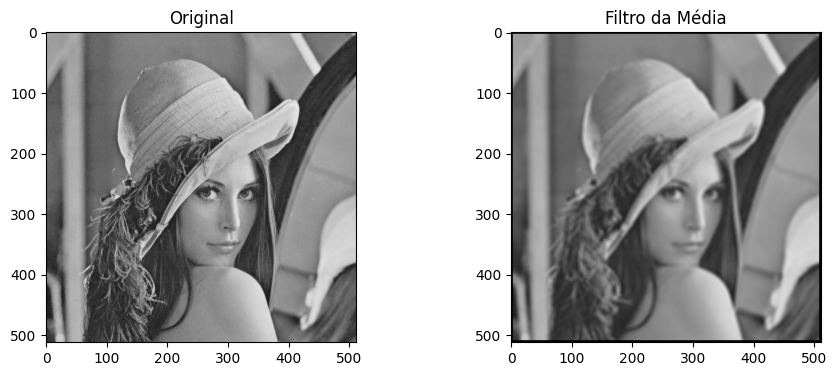

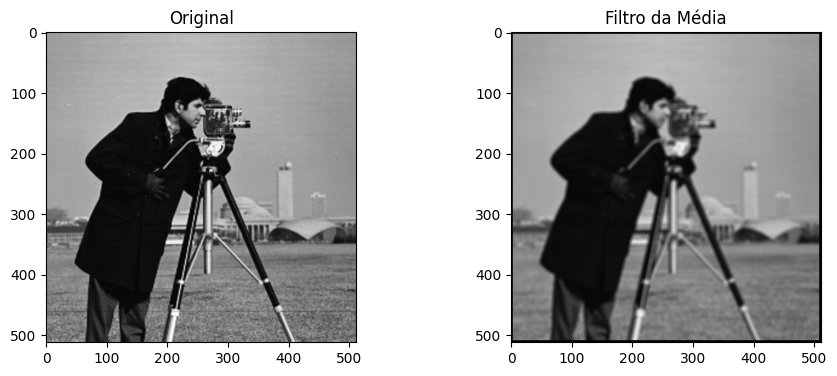

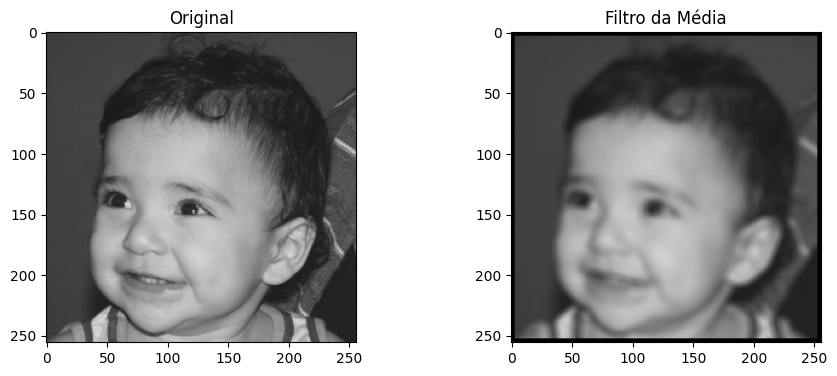

In [ ]:
def mean(img):
    g2_im_nd = np.zeros(img.shape)

    lines = img.shape[0]
    columns = img.shape[1]
    kernel_size = 3 
    
    for x in range(kernel_size, lines - kernel_size):
        for y in range(kernel_size, columns - kernel_size):
            s_xy = img[x-kernel_size:x+kernel_size+1, y-kernel_size:y+kernel_size+1]
            g2_im_nd[x,y] = np.mean(s_xy).astype(int)
    
    return g2_im_nd
    

new_lena = mean(lena)
show_img2(lena, new_lena, "Original", "Filtro da Média")
new_cam = mean(cam)
show_img2(cam, new_cam, "Original", "Filtro da Média")
new_biel = mean(biel)
show_img2(biel, new_biel, "Original", "Filtro da Média")

#### OpenCV

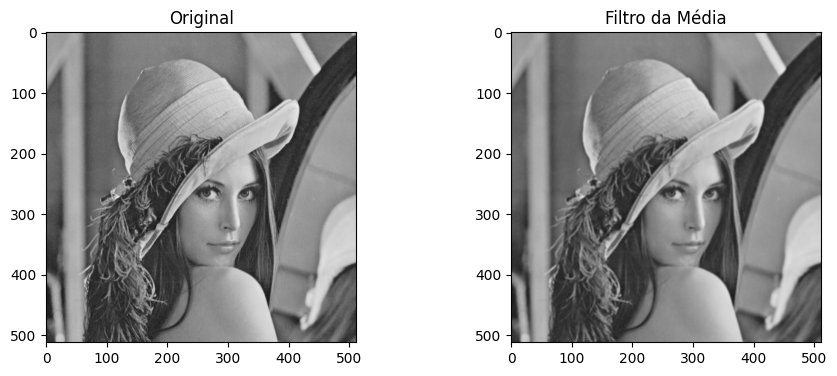

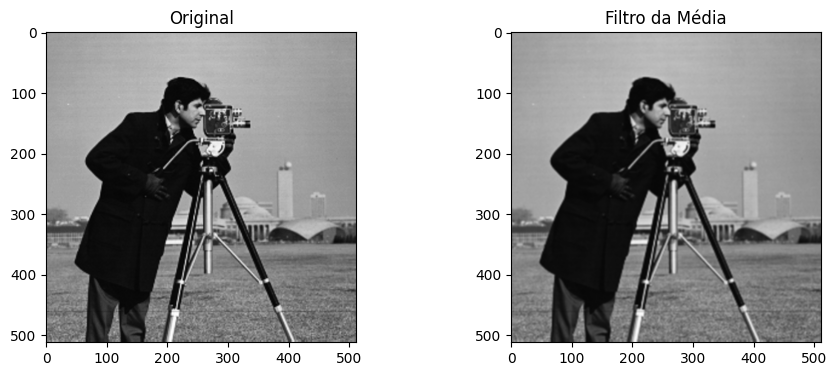

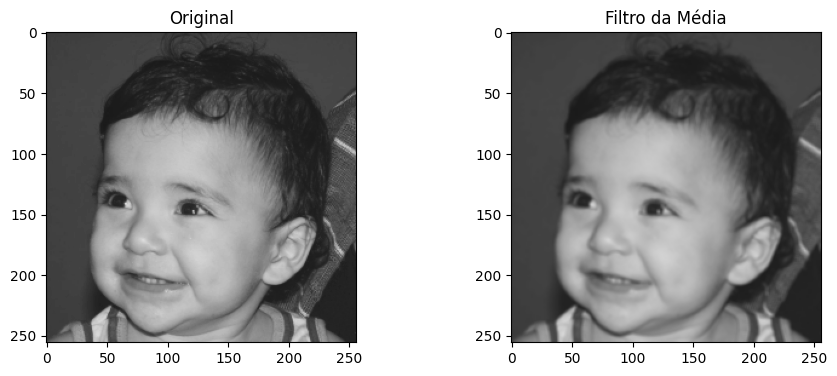

In [ ]:
lena_mean = lena_cv.copy()
lena_mean = cv2.blur(lena_mean, (3,3))
show_img2(lena, lena_mean, "Original", "Filtro da Média")

cam_mean = cam_cv.copy()
cam_mean = cv2.blur(cam_mean, (3,3))
show_img2(cam, cam_mean, "Original", "Filtro da Média")

biel_mean = biel_cv.copy()
biel_mean = cv2.blur(biel_mean, (3,3))
show_img2(biel, biel_mean, "Original", "Filtro da Média")

#### Scipy

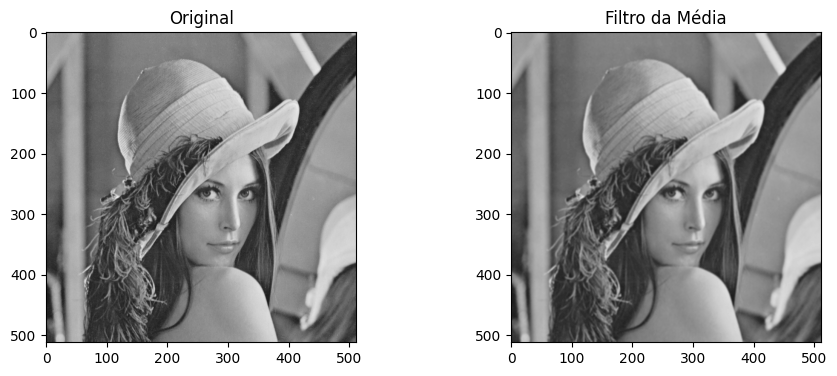

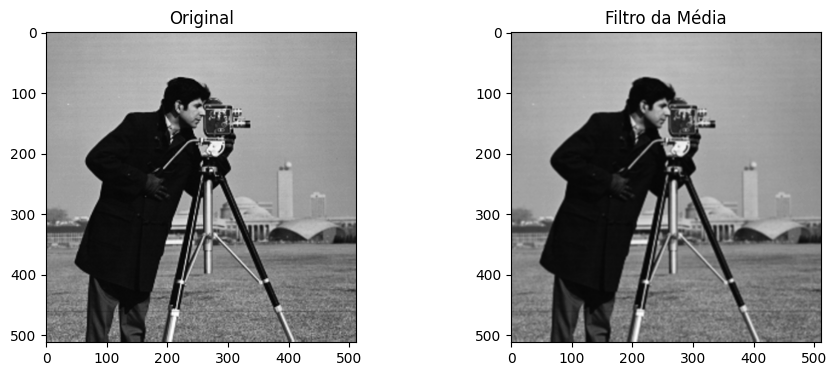

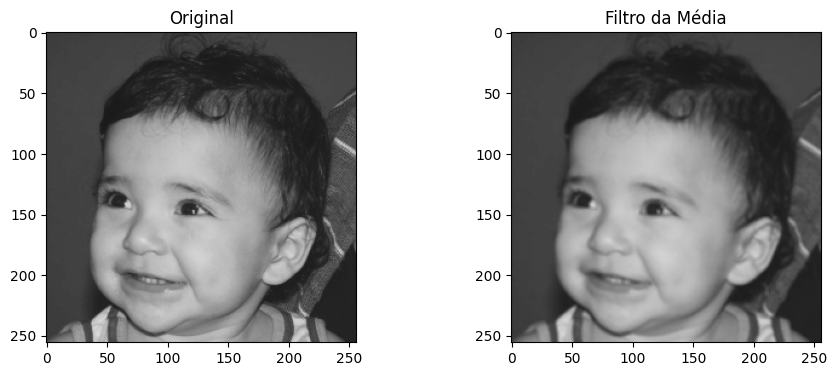

In [ ]:
lena_mean = ndimage.uniform_filter(lena, size=3)
show_img2(lena, lena_mean, "Original", "Filtro da Média")

cam_mean = ndimage.uniform_filter(cam, size=3)
show_img2(cam, cam_mean, "Original", "Filtro da Média")

biel_mean = ndimage.uniform_filter(biel, size=3)
show_img2(biel, biel_mean, "Original", "Filtro da Média")

### Guassiano

#### Manual

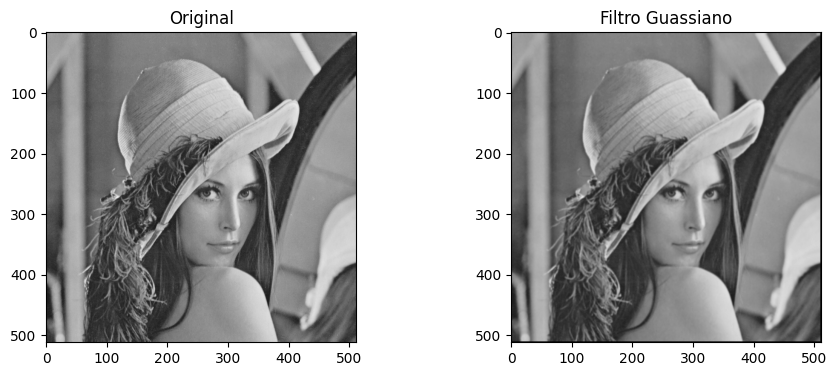

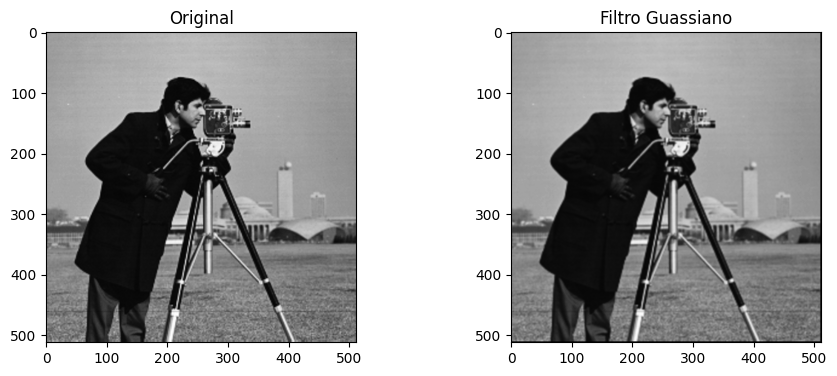

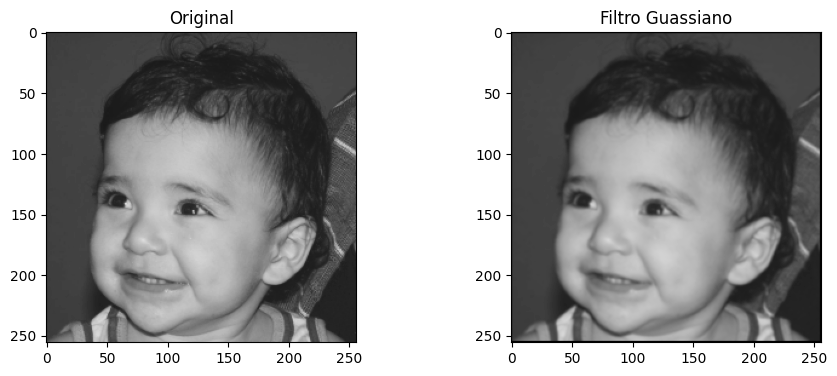

In [ ]:
gauss = np.array((
    [0.0625, 0.125, 0.0625], 
    [0.1250, 0.250, 0.1250],
    [0.0625, 0.125, 0.0625]), dtype="float")

new_lena = convolution(lena, gauss)
show_img2(lena, new_lena, "Original",  "Filtro Guassiano")
new_cam = convolution(cam, gauss)
show_img2(cam, new_cam, "Original",  "Filtro Guassiano")
new_biel = convolution(biel, gauss)
show_img2(biel, new_biel, "Original",  "Filtro Guassiano")

#### OpenCV

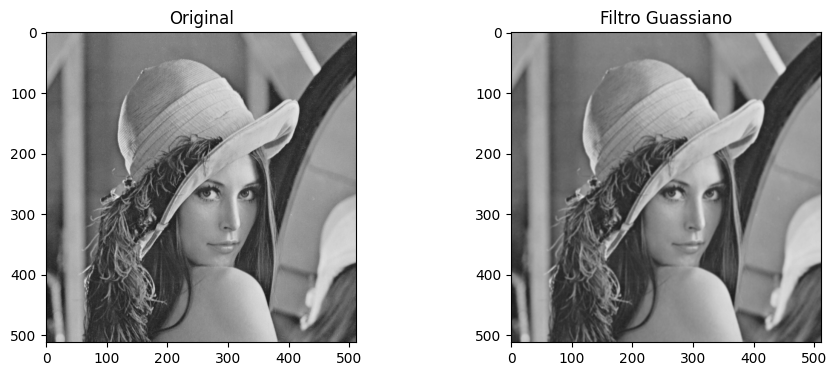

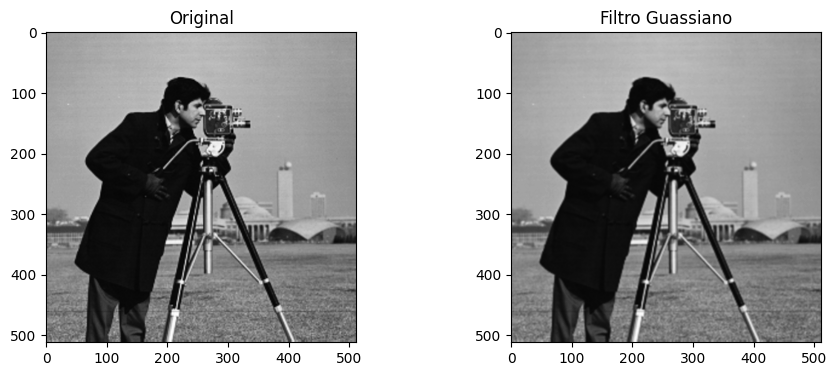

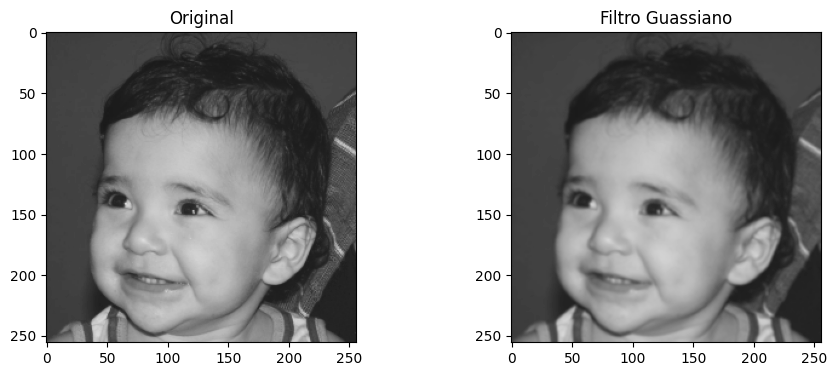

In [ ]:
new_lena = cv2.GaussianBlur(src=lena,ksize=(3,3),sigmaX=1)
show_img2(lena, new_lena, "Original", "Filtro Guassiano")
new_cam = cv2.GaussianBlur(src=cam,ksize=(3,3),sigmaX=1)
show_img2(cam, new_cam, "Original", "Filtro Guassiano")
new_biel = cv2.GaussianBlur(src=biel,ksize=(3,3),sigmaX=1)
show_img2(biel, new_biel, "Original", "Filtro Guassiano")

#### Scipy

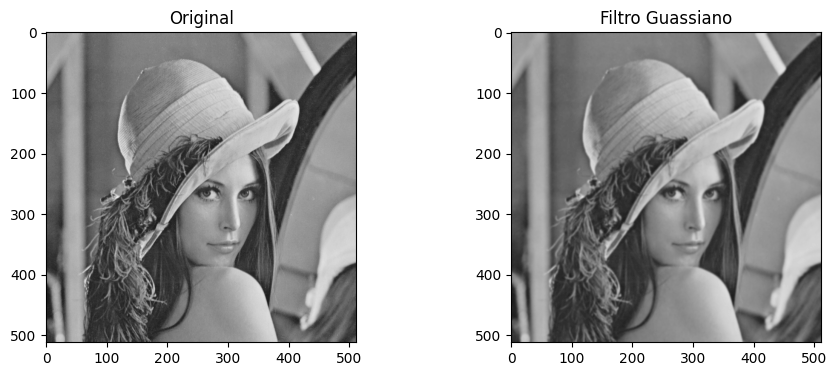

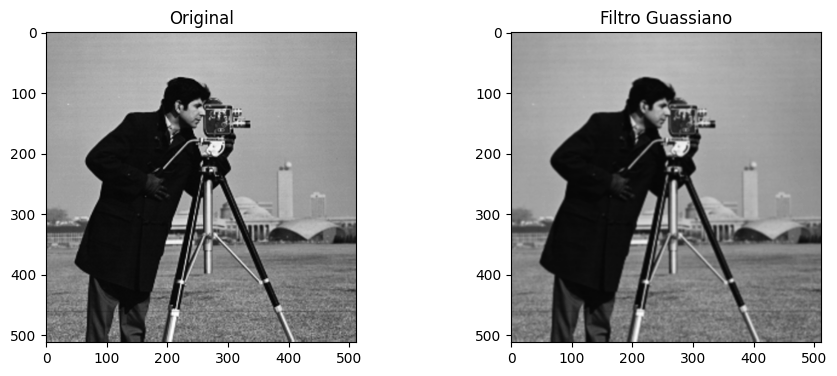

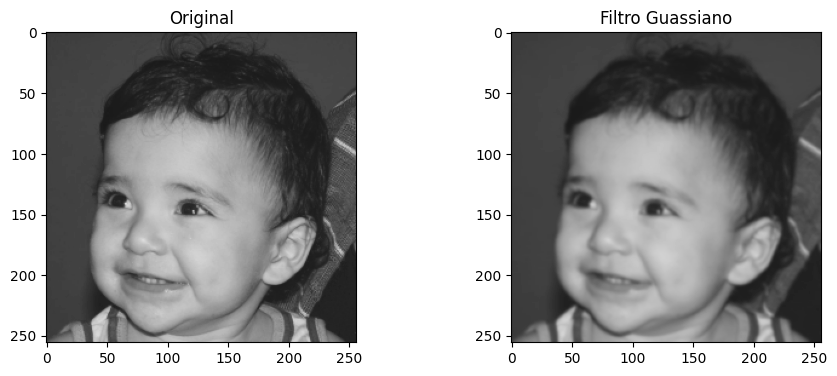

In [ ]:
new_lena = gaussian_filter(lena, sigma=1)
show_img2(lena, new_lena, "Original", "Filtro Guassiano")
new_cam = gaussian_filter(cam, sigma=1)
show_img2(cam, new_cam, "Original", "Filtro Guassiano")
new_biel = gaussian_filter(biel, sigma=1)
show_img2(biel, new_biel, "Original", "Filtro Guassiano")

### Laplaciano

#### Manual

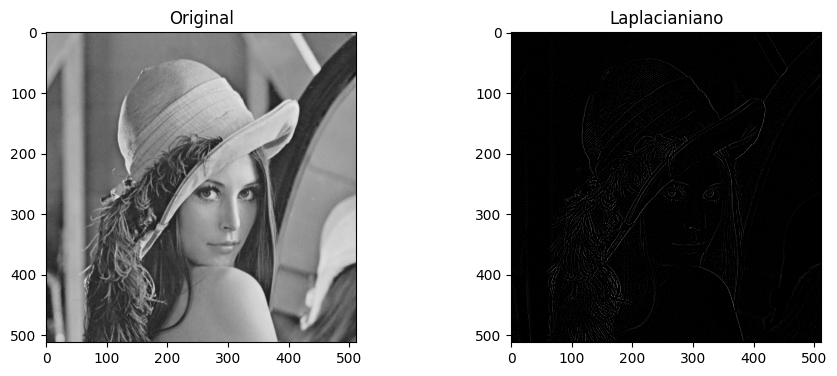

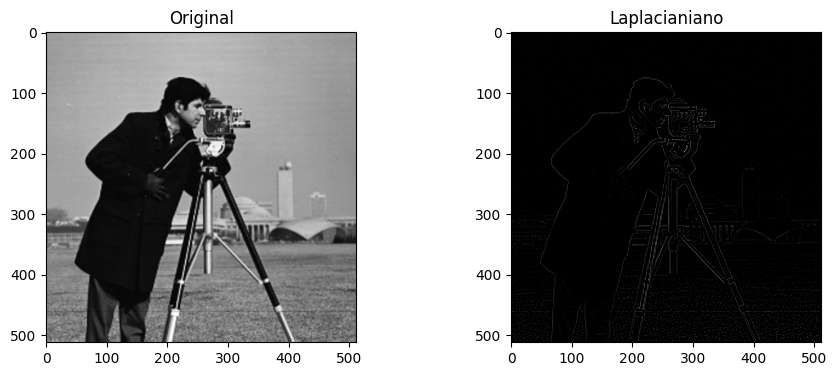

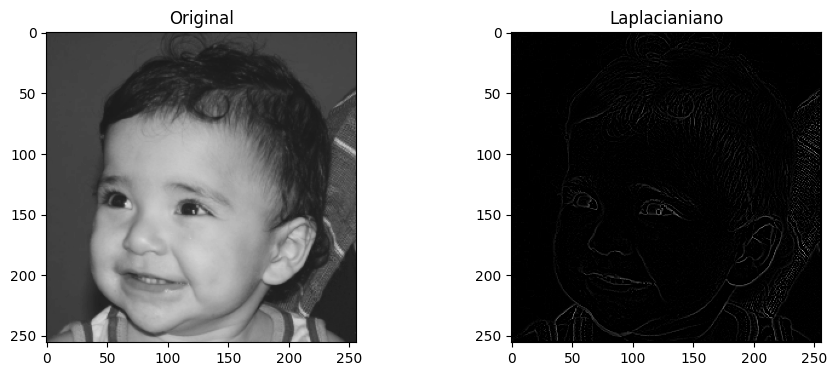

In [ ]:
kernel_laplacian = np.array((
                            [0,  1, 0],
                            [1, -4, 1],
                            [0,  1, 0]), dtype="int")

lena_laplacian_manual = convolution(lena, kernel_laplacian)
show_img2(lena, lena_laplacian_manual, "Original", "Laplacianiano")
cam_laplacian_manual = convolution(cam, kernel_laplacian)
show_img2(cam, cam_laplacian_manual, "Original", "Laplacianiano")
biel_laplacian_manual = convolution(biel, kernel_laplacian)
show_img2(biel, biel_laplacian_manual, "Original", "Laplacianiano")

#### OpenCV

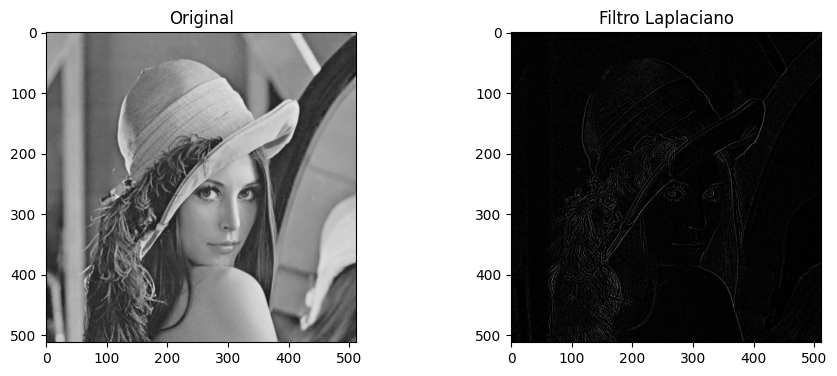

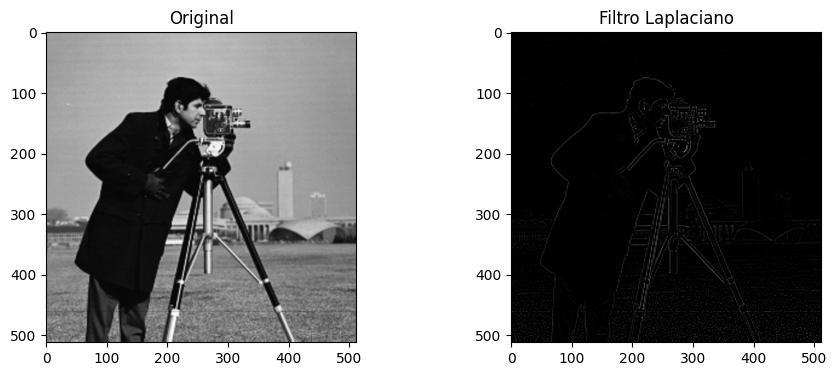

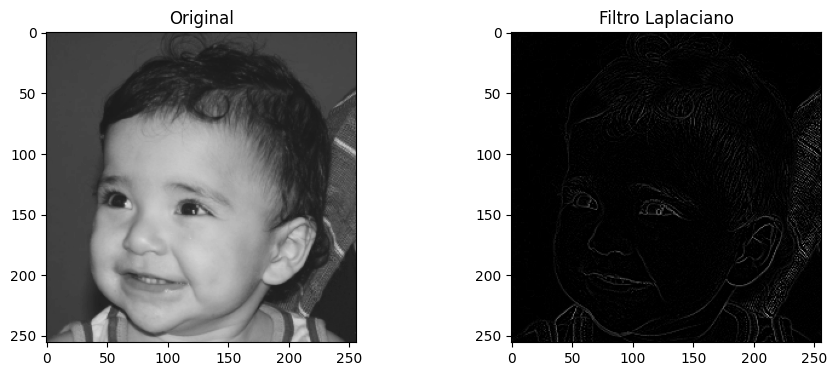

In [ ]:
lena_laplacian_cv = cv2.filter2D(src= lena, ddepth=-1, kernel=kernel_laplacian)
show_img2(lena, lena_laplacian_cv, "Original", "Filtro Laplaciano")
cam_laplacian_cv = cv2.filter2D(src= cam, ddepth=-1, kernel=kernel_laplacian)
show_img2(cam, cam_laplacian_cv, "Original", "Filtro Laplaciano")
biel_laplacian_cv = cv2.filter2D(src= biel, ddepth=-1, kernel=kernel_laplacian)
show_img2(biel, biel_laplacian_cv, "Original", "Filtro Laplaciano")

#### Scipy

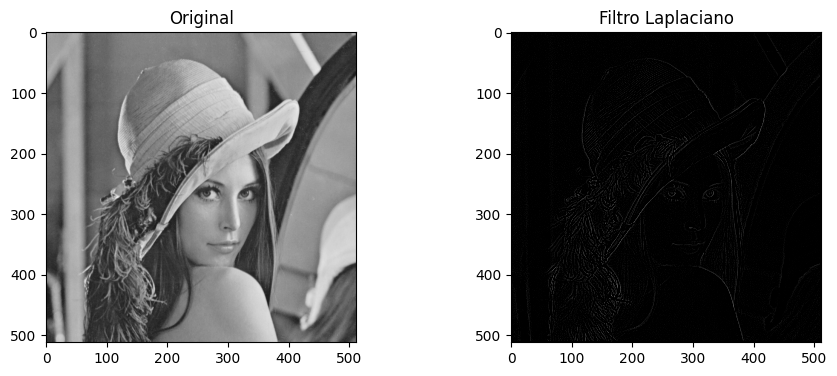

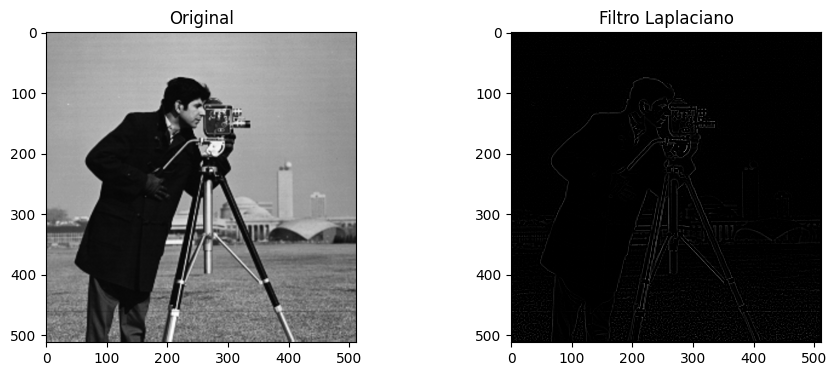

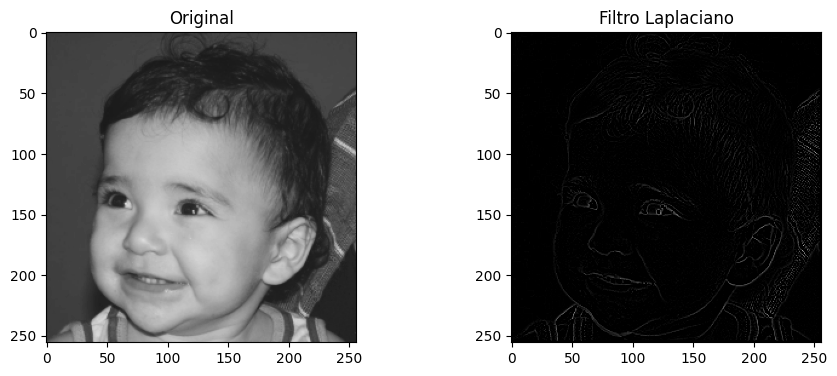

In [ ]:
lena_laplacian_sc = signal.convolve(lena, kernel_laplacian, mode='same')
show_img2(lena, lena_laplacian_sc, "Original", "Filtro Laplaciano")
cam_laplacian_sc = signal.convolve(cam, kernel_laplacian, mode='same')
show_img2(cam, cam_laplacian_sc, "Original", "Filtro Laplaciano")
biel_laplacian_sc = signal.convolve(biel, kernel_laplacian, mode='same')
show_img2(biel, biel_laplacian_sc, "Original", "Filtro Laplaciano")

### Sobel X

#### Manual

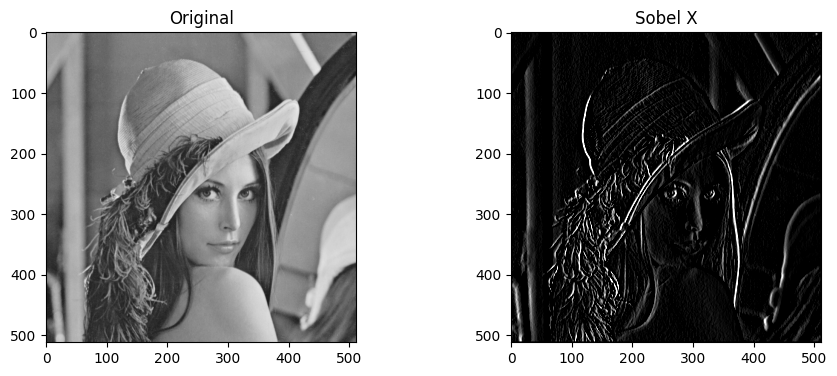

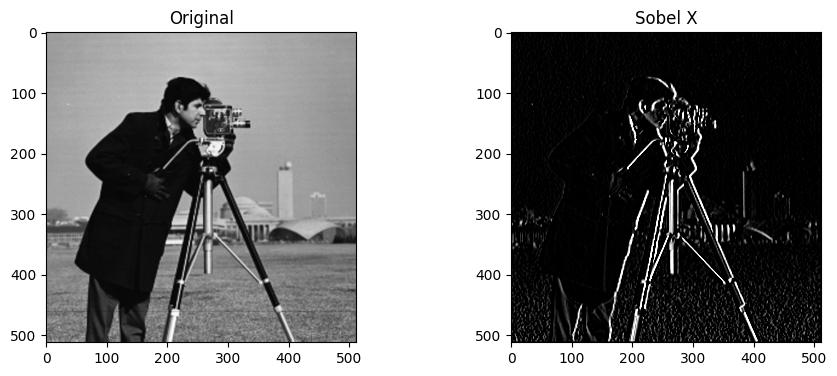

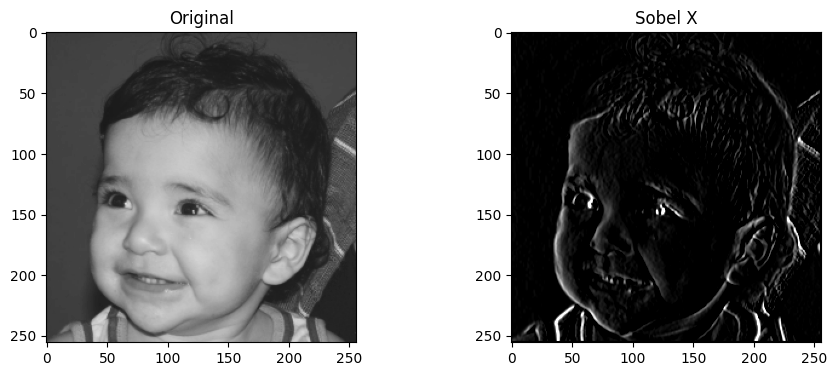

In [ ]:
kernel_sobelX = np.array((
                    [-1, 0, 1],
                    [-2, 0, 2],
                    [-1, 0, 1]))
sobelx_manual_lena = convolution(lena, kernel_sobelX)
show_img2(lena,sobelx_manual_lena, "Original", "Sobel X")
sobelx_manual_cam = convolution(cam, kernel_sobelX)
show_img2(cam,sobelx_manual_cam, "Original", "Sobel X")
sobelx_manual_biel = convolution(biel, kernel_sobelX)
show_img2(biel,sobelx_manual_biel, "Original", "Sobel X")

#### OpenCV

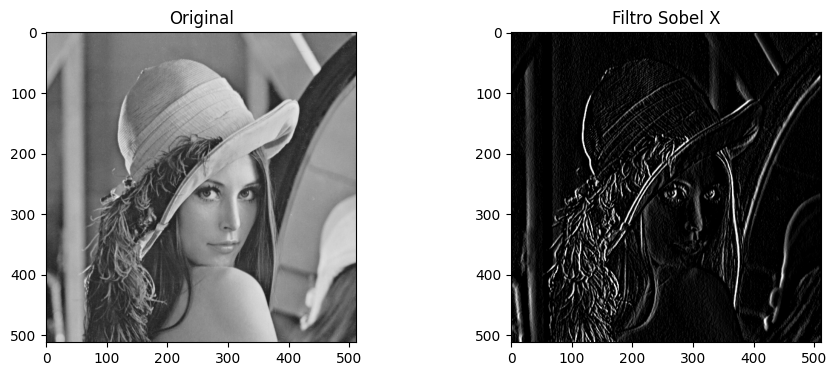

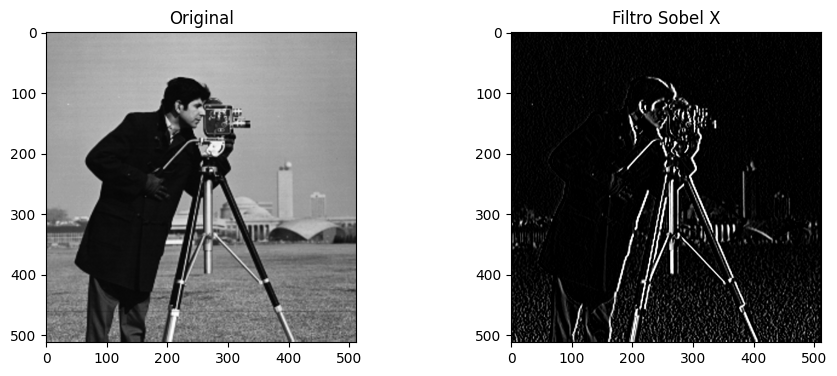

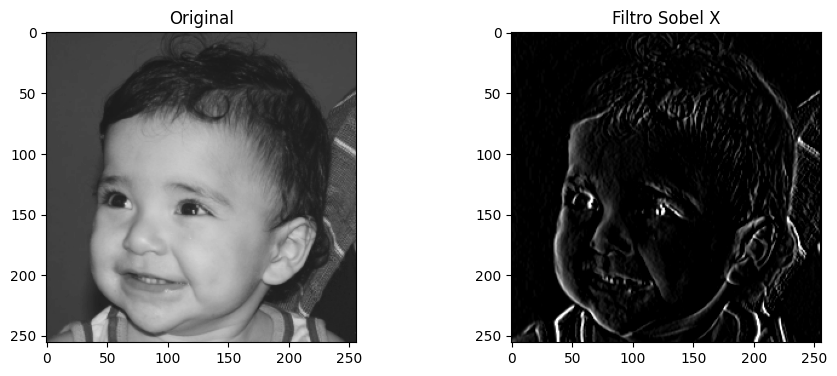

In [ ]:
sobel_x_lena_cv = cv2.filter2D(src= lena, ddepth=-1, kernel=kernel_sobelX)
show_img2(lena, sobel_x_lena_cv, "Original", "Filtro Sobel X")
sobel_x_cam_cv = cv2.filter2D(src=cam, ddepth=-1, kernel=kernel_sobelX)
show_img2(cam, sobel_x_cam_cv , "Original", "Filtro Sobel X")
sobel_x_biel_cv = cv2.filter2D(src=biel, ddepth=-1, kernel=kernel_sobelX)
show_img2(biel, sobel_x_biel_cv, "Original", "Filtro Sobel X")

#### Scipy

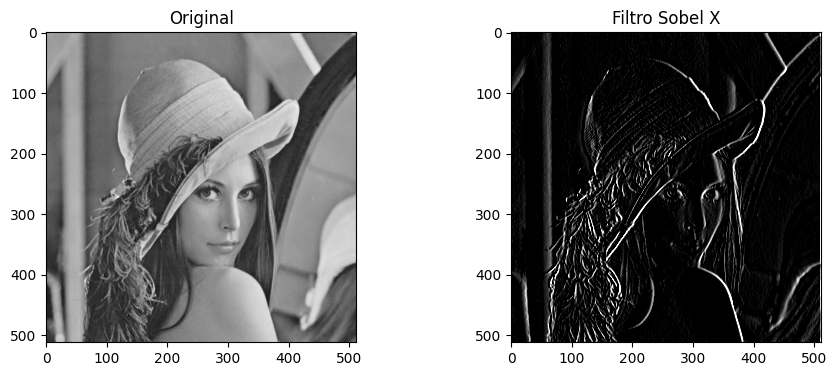

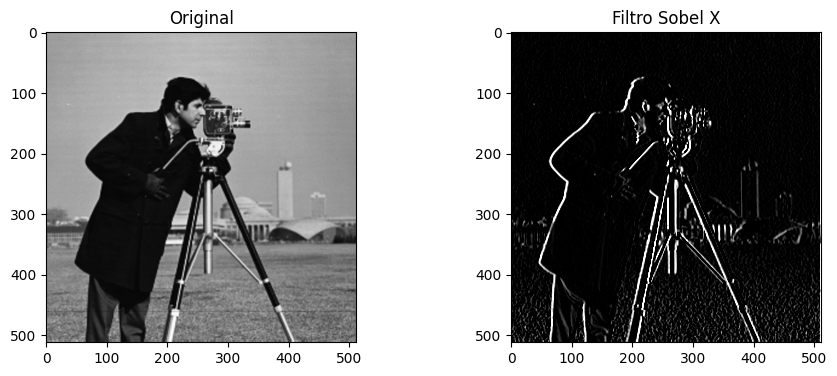

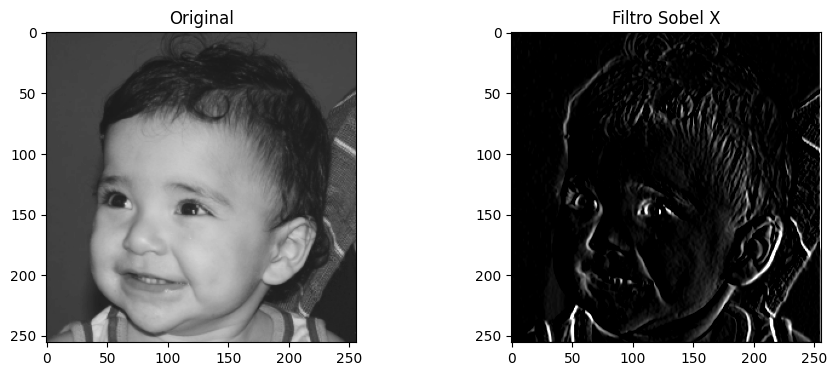

In [ ]:
sobel_x_lena = signal.convolve(lena, kernel_sobelX, mode="same")
show_img2(lena, sobel_x_lena, "Original", "Filtro Sobel X")
sobel_x_cam = signal.convolve(cam, kernel_sobelX, mode="same")
show_img2(cam, sobel_x_cam , "Original", "Filtro Sobel X")
sobel_x_biel = signal.convolve(biel, kernel_sobelX, mode="same")
show_img2(biel, sobel_x_biel, "Original", "Filtro Sobel X")

### Sobel Y

#### Manual

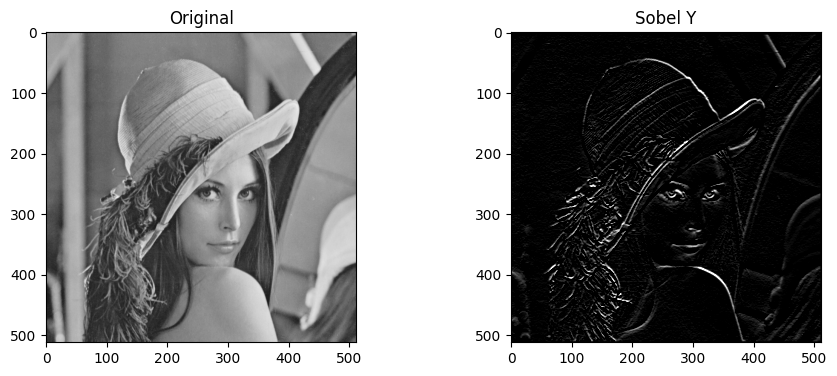

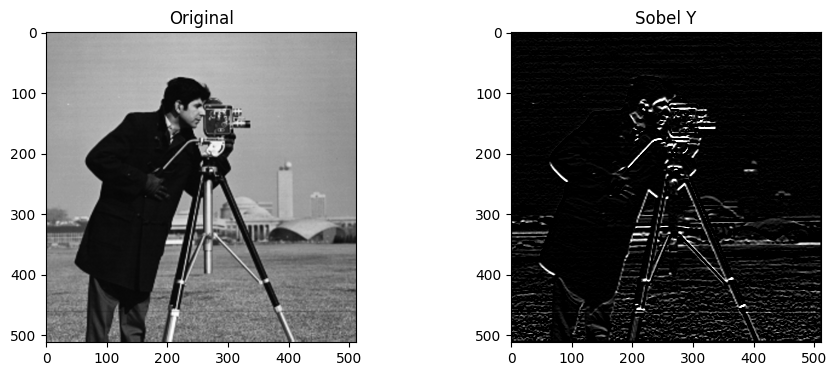

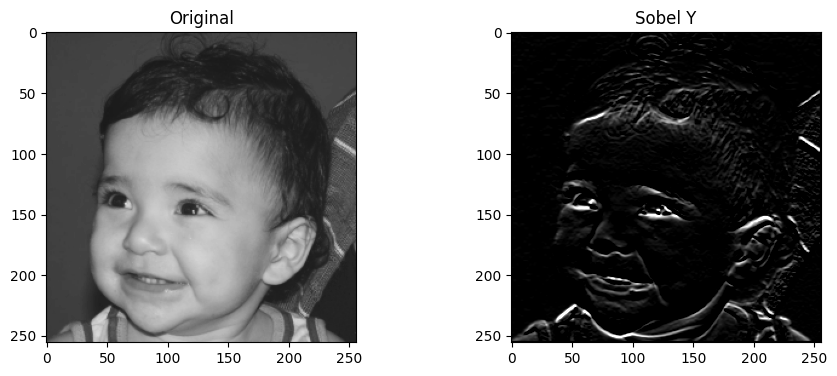

In [ ]:
kernel_sobely =np.array((
                [-1, -2, -1],
                [ 0,  0,  0],
                [ 1,  2,  1]), dtype="int")  
sobely_manual_lena = convolution(lena, kernel_sobely)
show_img2(lena,sobely_manual_lena, "Original", "Sobel Y")
sobely_manual_cam = convolution(cam, kernel_sobely)
show_img2(cam,sobely_manual_cam, "Original", "Sobel Y")
sobely_manual_biel = convolution(biel, kernel_sobely)
show_img2(biel,sobely_manual_biel, "Original", "Sobel Y")

#### OpenCV

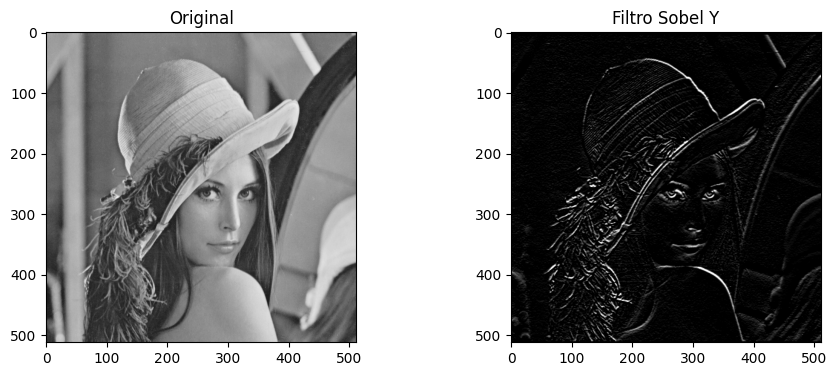

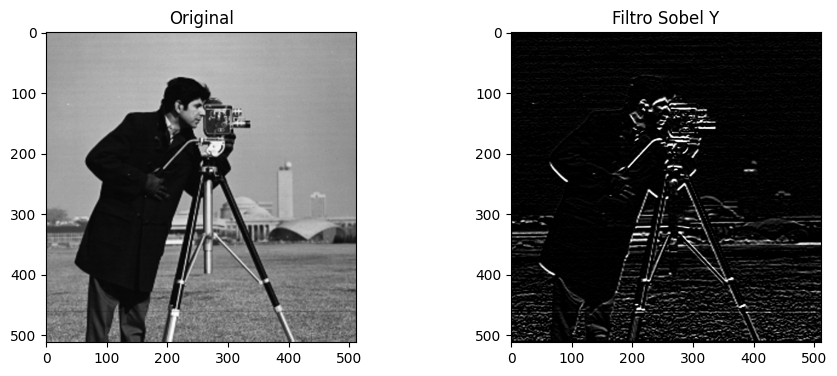

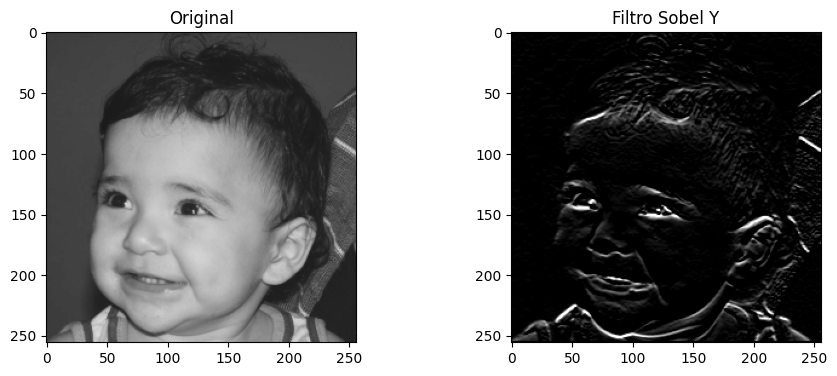

In [ ]:
sobel_y_lena_cv = cv2.filter2D(src= lena, ddepth=-1, kernel=kernel_sobely)
show_img2(lena, sobel_y_lena_cv, "Original", "Filtro Sobel Y")
sobel_y_cam_cv = cv2.filter2D(src= cam, ddepth=-1, kernel=kernel_sobely)
show_img2(cam, sobel_y_cam_cv , "Original", "Filtro Sobel Y")
sobel_y_biel_cv = cv2.filter2D(src= biel, ddepth=-1, kernel=kernel_sobely)
show_img2(biel, sobel_y_biel_cv, "Original", "Filtro Sobel Y")

#### Scipy

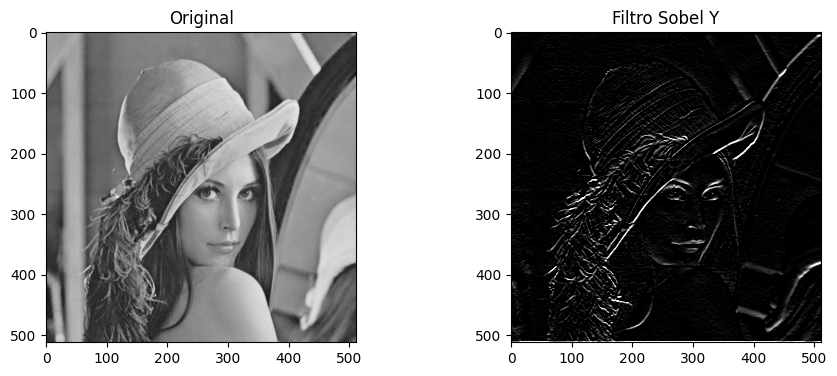

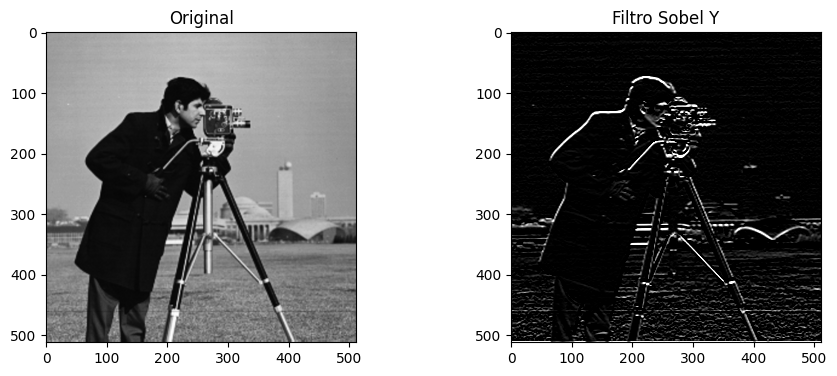

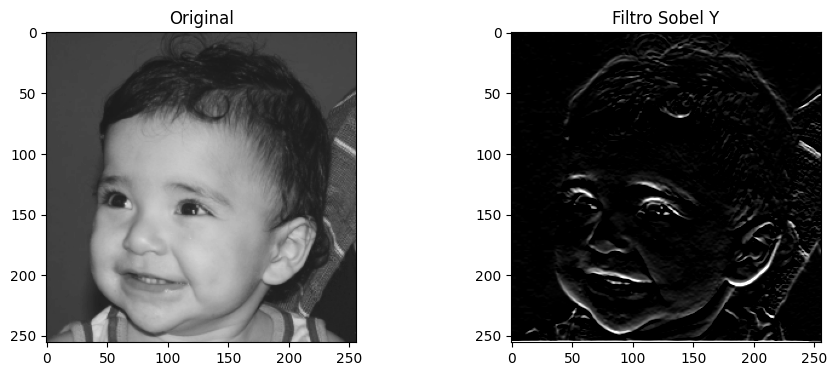

In [ ]:
sobel_Y_lena = signal.convolve(lena, kernel_sobely, mode="same")
show_img2(lena, sobel_Y_lena, "Original", "Filtro Sobel Y")
sobel_Y_cam = signal.convolve(cam, kernel_sobely, mode="same")
show_img2(cam, sobel_Y_cam , "Original", "Filtro Sobel Y")
sobel_Y_biel = signal.convolve(biel, kernel_sobely, mode="same")
show_img2(biel, sobel_Y_biel, "Original", "Filtro Sobel Y")

### Gradiente (Sobel X + Sobel Y)

#### Manual

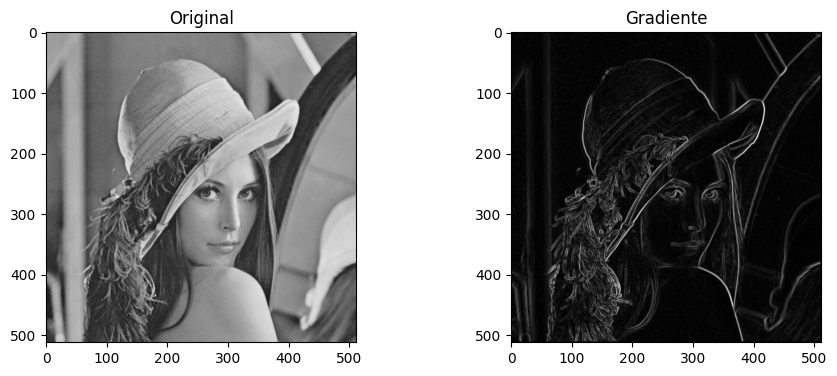

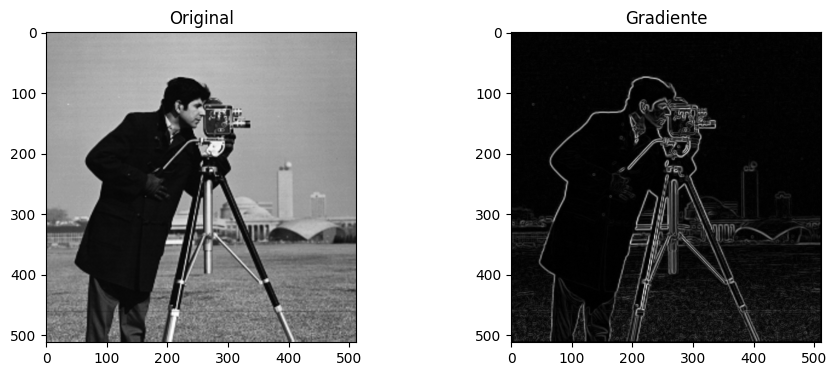

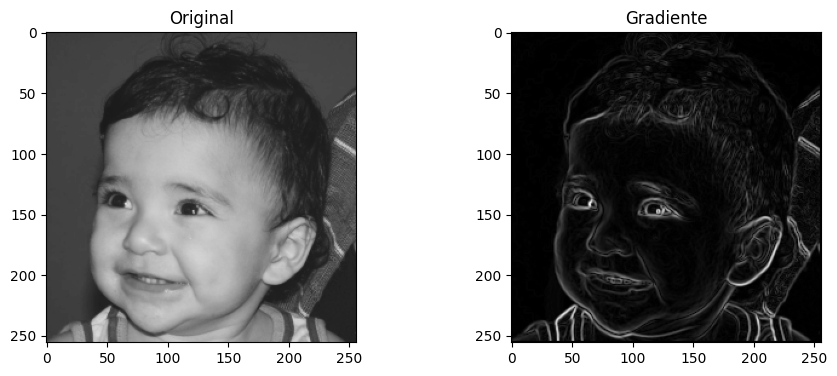

In [ ]:
def gradient(sobelx, sobely):
    img_gradiant = np.sqrt(sobelx**2 + sobely**2)
    img_gradiant *= 255.0 / np.max(img_gradiant) 
    return img_gradiant

gradient_lena = gradient(sobelx_manual_lena, sobely_manual_lena)
show_img2(lena,gradient_lena, "Original", "Gradiente")
gradient_cam = gradient(sobelx_manual_cam,sobely_manual_cam)
show_img2(cam,gradient_cam, "Original", "Gradiente")
gradient_biel = gradient(sobelx_manual_biel, sobely_manual_biel)
show_img2(biel,gradient_biel, "Original", "Gradiente")
    

#### OpenCV

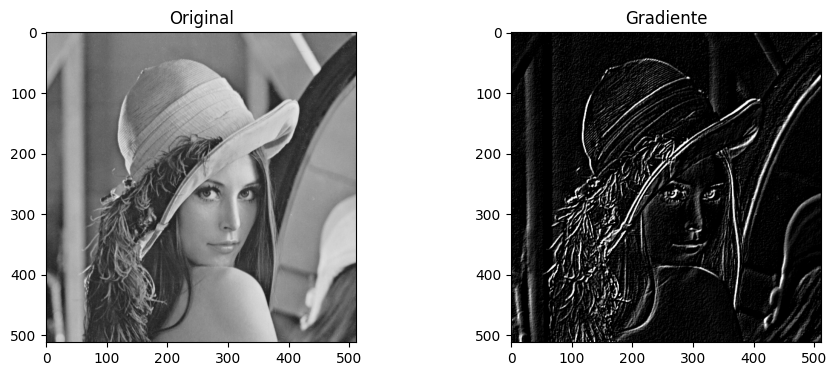

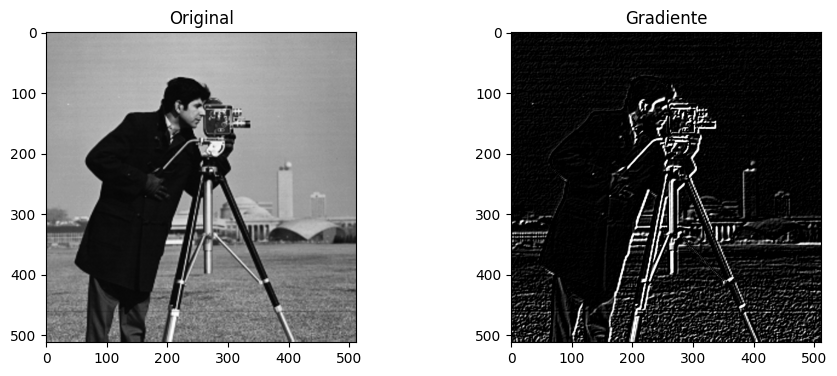

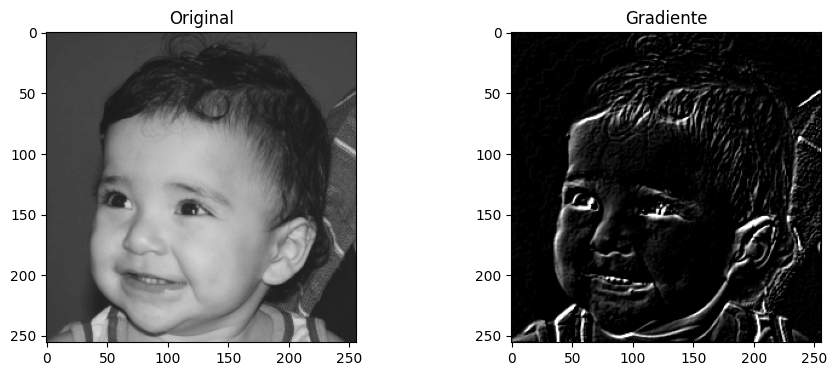

In [ ]:
gradiente_lena = cv2.filter2D(src= lena, ddepth=-1, kernel=kernel_sobelX+kernel_sobely)
show_img2(lena, gradiente_lena, "Original", "Gradiente")
gradiente_cam = cv2.filter2D(src= cam, ddepth=-1, kernel=kernel_sobelX+kernel_sobely)
show_img2(cam, gradiente_cam , "Original", "Gradiente")
gradiente_biel = cv2.filter2D(src= biel, ddepth=-1, kernel=kernel_sobelX+kernel_sobely)
show_img2(biel, gradiente_biel, "Original", "Gradiente")

#### Scipy

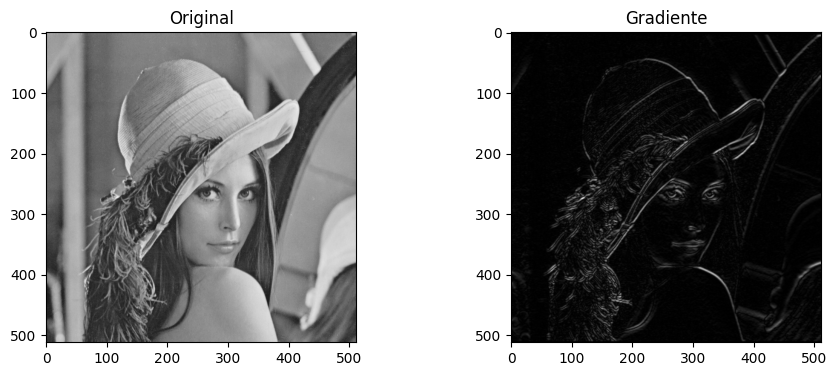

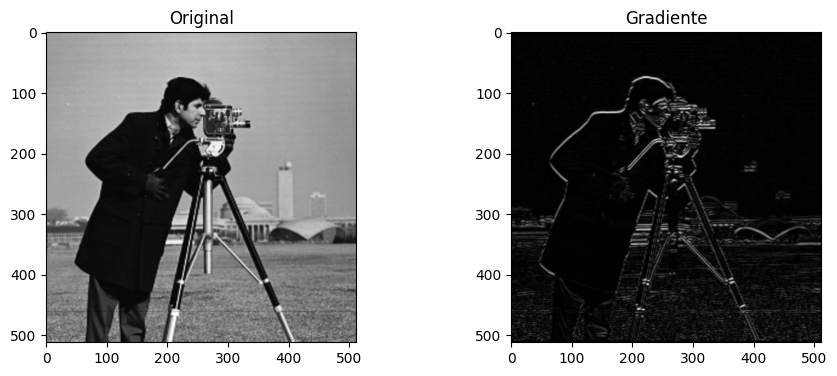

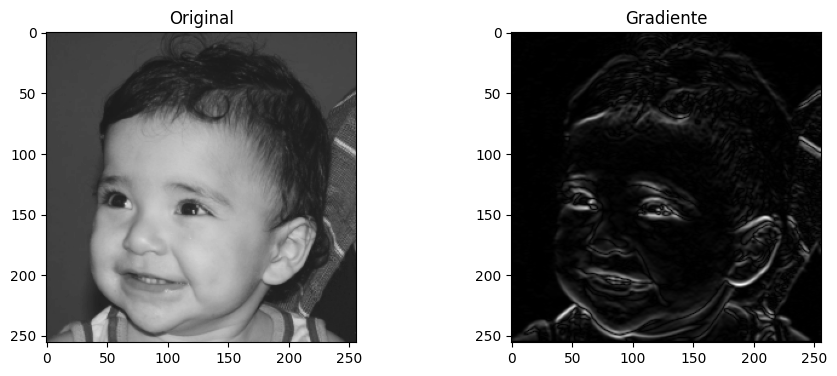

In [ ]:
lena_gradiente = np.sqrt(sobel_x_lena**2 + sobel_Y_lena**2)
lena_gradiente *= 255.0 / np.max(lena_gradiente) 
show_img2(lena,lena_gradiente, "Original", "Gradiente")

cam_gradiente = np.sqrt(sobel_x_cam**2 + sobel_Y_cam**2)
cam_gradiente *= 255.0 / np.max(cam_gradiente) 
show_img2(cam,cam_gradiente, "Original", "Gradiente")

biel_gradiente = np.sqrt(sobel_x_biel**2 + sobel_Y_biel**2)
biel_gradiente *= 255.0 / np.max(biel_gradiente) 
show_img2(biel,biel_gradiente, "Original", "Gradiente")

### Laplaciano somado a imagem original

#### Manual

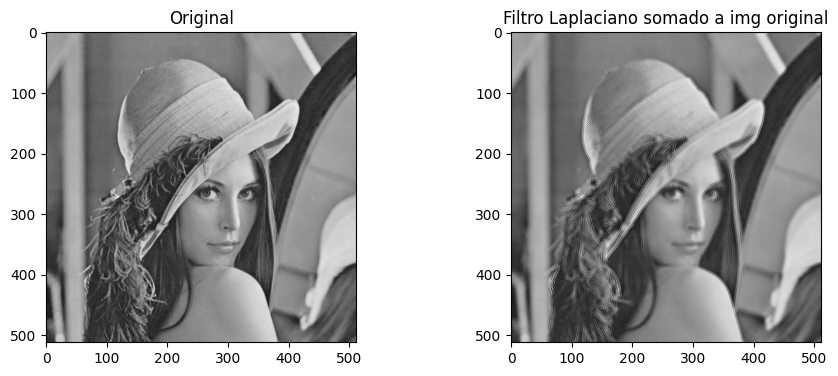

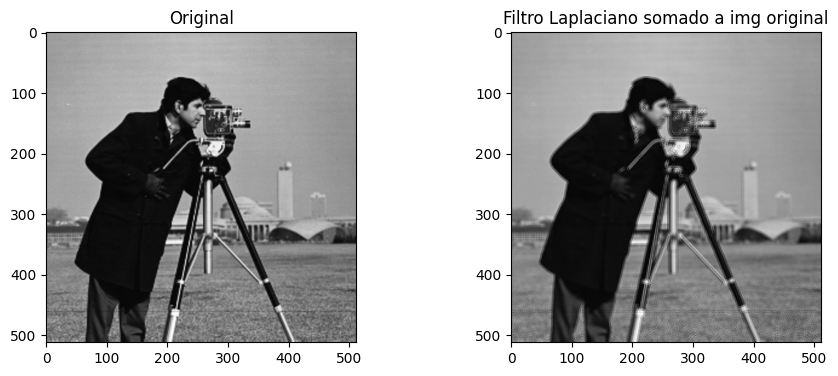

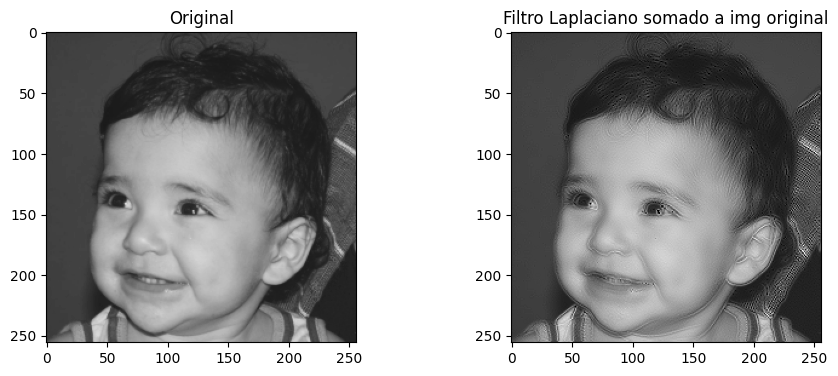

In [ ]:
new_lena = lena + lena_laplacian_manual
show_img2(lena, new_lena, "Original", "Filtro Laplaciano somado a img original")
new_cam = cam + cam_laplacian_manual
show_img2(cam, new_cam, "Original", "Filtro Laplaciano somado a img original")
new_biel = biel + biel_laplacian_manual
show_img2(biel, new_biel, "Original", "Filtro Laplaciano somado a img original")

#### OpenCV

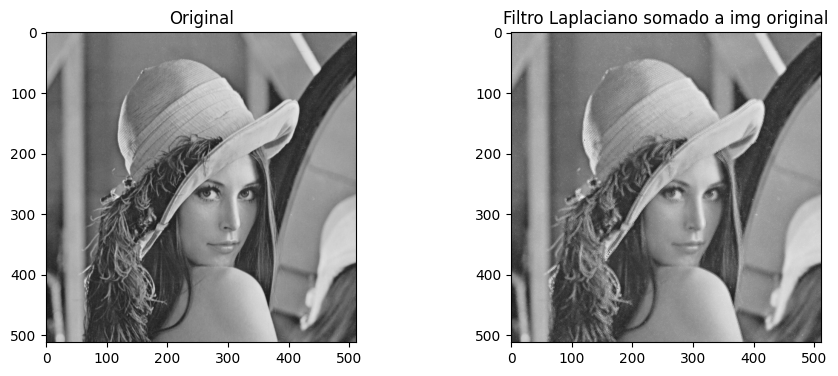

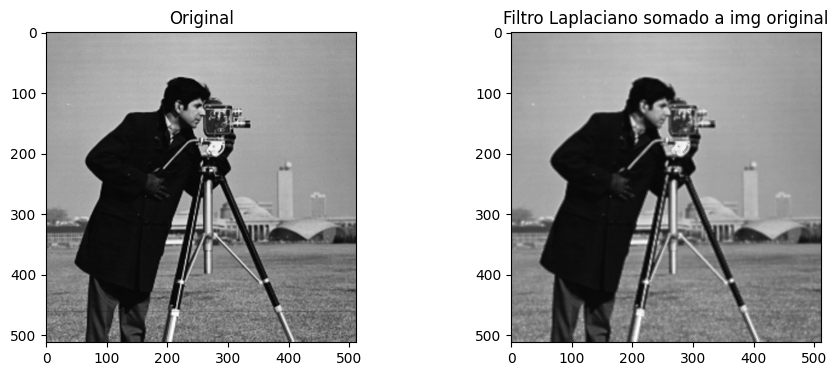

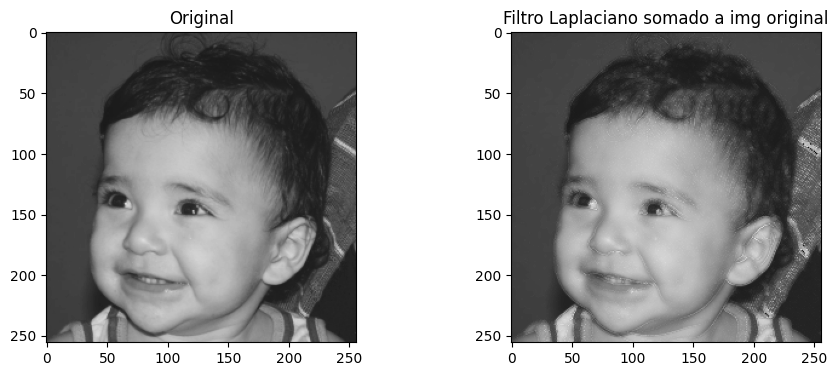

In [ ]:
new_lena = lena + lena_laplacian_cv
show_img2(lena, new_lena, "Original", "Filtro Laplaciano somado a img original")
new_cam = cam + cam_laplacian_cv
show_img2(cam, new_cam, "Original", "Filtro Laplaciano somado a img original")
new_biel = biel + biel_laplacian_cv
show_img2(biel, new_biel, "Original", "Filtro Laplaciano somado a img original")

#### Scipy

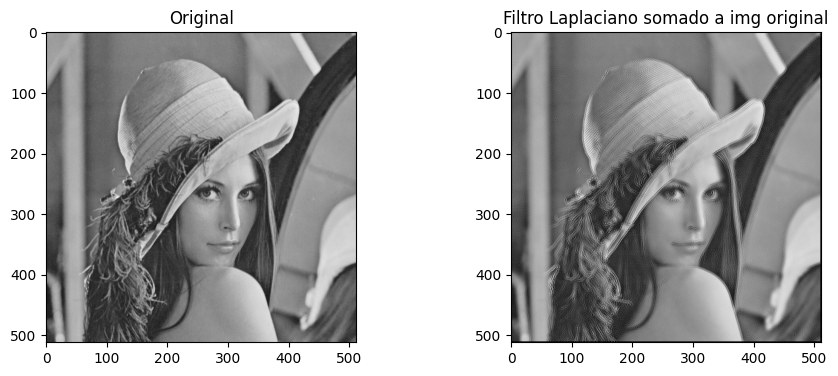

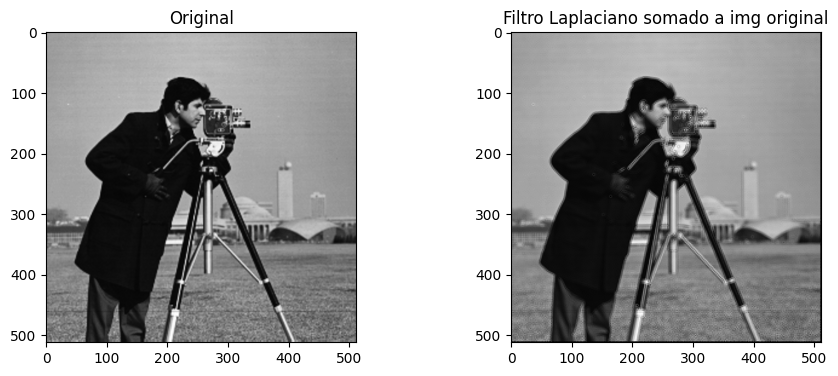

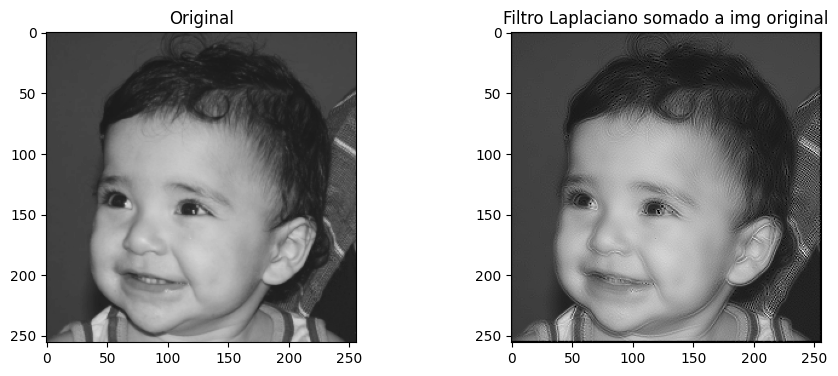

In [ ]:
new_lena = lena + lena_laplacian_sc
show_img2(lena, new_lena, "Original", "Filtro Laplaciano somado a img original")
new_cam = cam + cam_laplacian_sc
show_img2(cam, new_cam, "Original", "Filtro Laplaciano somado a img original")
new_biel = biel + biel_laplacian_sc
show_img2(biel, new_biel, "Original", "Filtro Laplaciano somado a img original")